# Introducción

En este cuaderno veremos cómo poner en producción un modelo de ML previamente entrenado. Esto significa hacer que el modelo sea accesible desde otros ordenadores, quienes pueden mandarle ejemplos $x$ y obtener una respuesta con la predicción. Para ello, serviremos los modelos de ML creando APIs.

### Arquitectura general de un servicio de ML en producción

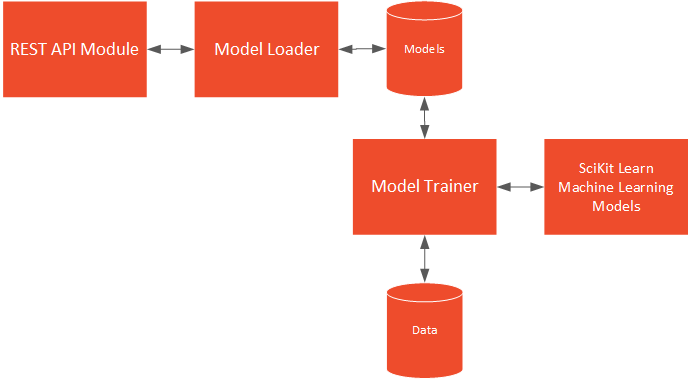

## APIs REST

No es más que un protocolo de comunicación entre ordenadores a través de internet.
Sistema basado en cliente - servidor.

* El cliente hace una consulta (en nuestro caso, manda unas features $x$)

* El servidor procesa los datos que le llegan, y devuelve una respuesta al cliente (en nuestro caso, la predicción $y$)

<div>
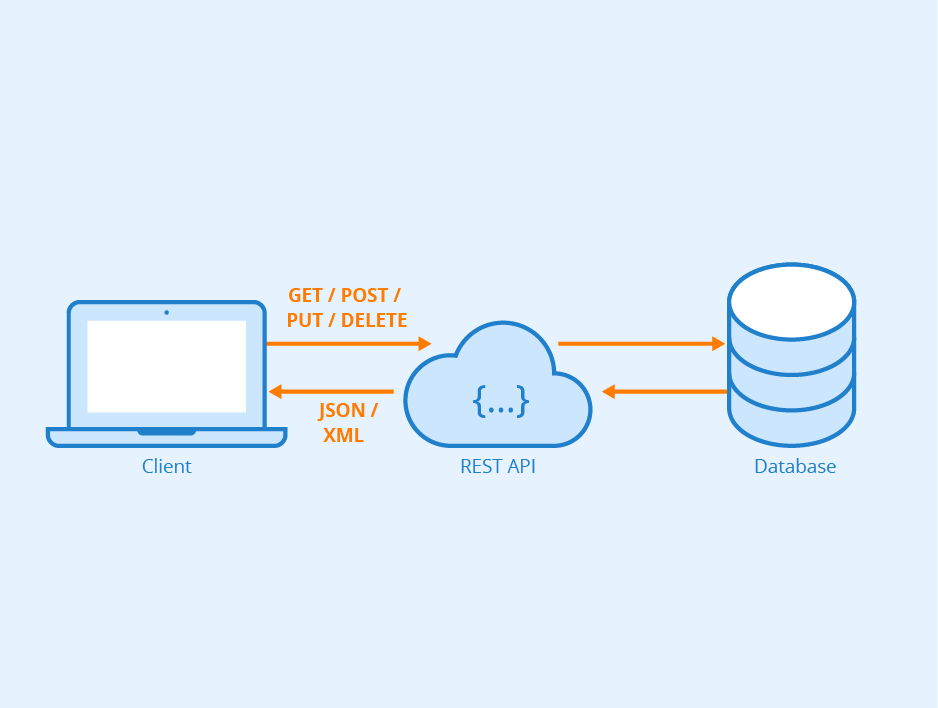
</div>

### Interactuando con una API

### Ejemplo https://www.el-tiempo.net/api

In [1]:
#!conda install -c anaconda requests -y
#!pip install requests
import requests

response = requests.get('https://www.el-tiempo.net/api/json/v2/provincias')

In [2]:
response.json()

{'title': 'Lista de provincias',
 'provincias': [{'CODPROV': '01',
   'NOMBRE_PROVINCIA': 'Araba/Álava',
   'CODAUTON': '16',
   'COMUNIDAD_CIUDAD_AUTONOMA': 'País Vasco/Euskadi',
   'CAPITAL_PROVINCIA': 'Vitoria-Gasteiz'},
  {'CODPROV': '02',
   'NOMBRE_PROVINCIA': 'Albacete',
   'CODAUTON': '08',
   'COMUNIDAD_CIUDAD_AUTONOMA': 'Castilla-La Mancha',
   'CAPITAL_PROVINCIA': 'Albacete'},
  {'CODPROV': '03',
   'NOMBRE_PROVINCIA': 'Alacant/Alicante',
   'CODAUTON': '10',
   'COMUNIDAD_CIUDAD_AUTONOMA': 'Comunitat Valenciana',
   'CAPITAL_PROVINCIA': 'Alicante/Alacant'},
  {'CODPROV': '04',
   'NOMBRE_PROVINCIA': 'Almería',
   'CODAUTON': '01',
   'COMUNIDAD_CIUDAD_AUTONOMA': 'Andalucía',
   'CAPITAL_PROVINCIA': 'Almería'},
  {'CODPROV': '05',
   'NOMBRE_PROVINCIA': 'Ávila',
   'CODAUTON': '07',
   'COMUNIDAD_CIUDAD_AUTONOMA': 'Castilla y León',
   'CAPITAL_PROVINCIA': 'Ávila'},
  {'CODPROV': '06',
   'NOMBRE_PROVINCIA': 'Badajoz',
   'CODAUTON': '11',
   'COMUNIDAD_CIUDAD_AUTONOMA': 'Ex

In [3]:
response = requests.get('https://www.el-tiempo.net/api/json/v2/provincias/28/municipios/28079')

In [4]:
response.json()

{'municipio': {'CODIGOINE': '28079000000',
  'ID_REL': '1280796',
  'COD_GEO': '28001',
  'CODPROV': '28',
  'NOMBRE_PROVINCIA': 'Madrid',
  'NOMBRE': 'Madrid',
  'POBLACION_MUNI': 3165235,
  'SUPERFICIE': 60577.2354,
  'PERIMETRO': 172242,
  'CODIGOINE_CAPITAL': '28079000101',
  'NOMBRE_CAPITAL': 'Madrid',
  'POBLACION_CAPITAL': '3165235',
  'HOJA_MTN25': '0559-3',
  'LONGITUD_ETRS89_REGCAN95': -3.68760088,
  'LATITUD_ETRS89_REGCAN95': 40.40841191,
  'ORIGEN_COORD': 'Mapa',
  'ALTITUD': 657,
  'ORIGEN_ALTITUD': 'MDT5',
  'DISCREPANTE_INE': 0},
 'fecha': '2021-09-12',
 'stateSky': {'description': 'Despejado', 'id': '11'},
 'temperatura_actual': '24',
 'temperaturas': {'max': '31', 'min': '16'},
 'humedad': '35',
 'viento': '7',
 'lluvia': '0',
 'imagen': None,
 'pronostico': {'hoy': {'@attributes': {'fecha': '2021-09-12',
    'orto': '07:52',
    'ocaso': '20:28'},
   'estado_cielo': ['11n',
    '11n',
    '11n',
    '11n',
    '12n',
    '11n',
    '11',
    '11',
    '11',
    '11',


### Ejercicio

Utilizando la API de la Red Eléctrica Española, obtener el balance eléctrico para el mes pasado

https://www.ree.es/es/apidatos

In [24]:
response = requests.get('https://apidatos.ree.es/es/datos/balance/balance-electrico?start_date=2021-08-01T00:00&end_date=2021-08-31T23:59&time_trunc=day')

response.json()

{'data': {'type': 'Balance de energía eléctrica',
  'id': 'bal1',
  'attributes': {'title': 'Balance de energía eléctrica',
   'last-update': '2021-09-08T10:06:28.000+02:00',
   'description': 'Balance eléctrico: asignación de unidades de producción según combustible principal. La producción neta de las instalaciones no renovables e hidráulicas UGH tiene descontados los consumos propios de las instalaciones. En dichos tipos de producción una generación negativa indica que la electricidad horaria consumida para los usos de las plantas excede la producción horaria de las instalaciones.'},
  'meta': {'cache-control': {'cache': 'MISS'}}},
 'included': [{'type': 'Renovable',
   'id': 'Renovable',
   'attributes': {'title': 'Renovable',
    'last-update': '2021-09-08T10:04:58.000+02:00',
    'description': None,
    'magnitude': None,
    'content': [{'type': 'Hidráulica',
      'id': '10288',
      'groupId': 'Renovable',
      'attributes': {'title': 'Hidráulica',
       'description': '10

## FastAPI

Es la forma más popular y rápida de crear APIs desde python.

https://fastapi.tiangolo.com/

<div>
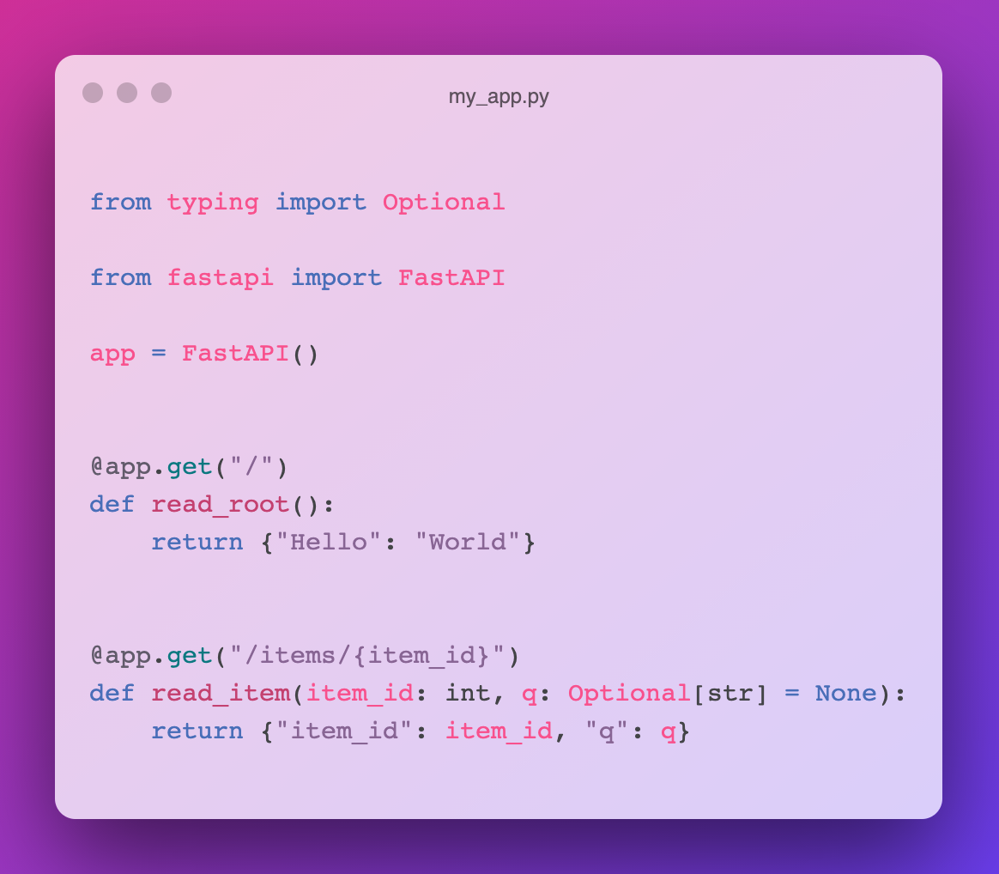
</div>

In [ ]:
#!conda install -c conda-forge fastapi pydantic -y

In [6]:
!uvicorn my_app:app --reload

INFO:     Uvicorn running on http://127.0.0.1:8000 (Press CTRL+C to quit)
INFO:     Started reloader process [1665] using statreload
INFO:     Started server process [1667]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     127.0.0.1:51450 - "GET / HTTP/1.1" 200 OK
INFO:     127.0.0.1:51450 - "GET /favicon.ico HTTP/1.1" 404 Not Found
INFO:     127.0.0.1:51451 - "GET / HTTP/1.1" 200 OK
INFO:     127.0.0.1:51460 - "GET /items/45 HTTP/1.1" 200 OK
INFO:     127.0.0.1:51464 - "GET /items/45?q=3 HTTP/1.1" 200 OK
INFO:     Shutting down
INFO:     Waiting for application shutdown.
INFO:     Application shutdown complete.
INFO:     Finished server process [1667]
Process SpawnProcess-2:
Traceback (most recent call last):
  File "/Users/victorgallego/miniconda3/lib/python3.8/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/Users/victorgallego/miniconda3/lib/python3.8/multiprocessing/process.py", line 108, in run
    self._targe

## Integrando todo con ML

### Ejemplo con penguins dataset

In [168]:
import numpy as np
import pandas as pd

In [170]:
df = pd.read_csv('data/penguins.csv')
df = df[['Species', 'Culmen Length (mm)', 'Culmen Depth (mm)', 'Flipper Length (mm)', 'Body Mass (g)']]

y = df['Species']
X = df.drop('Species', axis=1)

In [171]:
X

,Culmen Length (mm),Culmen Depth (mm),Flipper Length (mm),Body Mass (g)
0,39.1,18.7,181.0,3750.0
1,39.5,17.4,186.0,3800.0
2,40.3,18.0,195.0,3250.0
3,NaN,NaN,NaN,NaN
4,36.7,19.3,193.0,3450.0
...,...,...,...,...
339,55.8,19.8,207.0,4000.0
340,43.5,18.1,202.0,3400.0
341,49.6,18.2,193.0,3775.0
342,50.8,19.0,210.0,4100.0


In [172]:
from sklearn.model_selection import train_test_split

X_tr, X_te, y_tr, y_te = train_test_split(X, y, test_size=0.2, random_state=1)

In [173]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline

imp = SimpleImputer(strategy='median')
clf = GradientBoostingClassifier(n_estimators=100)

pipe = Pipeline([('imp', imp), ('clf', clf)])

In [174]:
pipe.fit(X_tr, y_tr)

Pipeline(steps=[('imp', SimpleImputer(strategy='median')),
                ('clf', GradientBoostingClassifier())])

In [175]:
pipe.score(X_te, y_te)

0.9420289855072463

### Guardando  y versionando el modelo

A la hora de guardar modelos, es conveniente utilizar algún nombre que vaya cambiando a medida que nuestro modelo evoluciona (reentrenamientos con nuevos datos, cambio de hiperparámetros, cambio de modelo...). 
Algunos criterios que se pueden utilizar:

* Utilizar versionado semántico: https://en.wikipedia.org/wiki/Software_versioning

    * 0.0 -> 1.0 (cambio muy importante)
    * 0.0 -> 0.1 (cambio poco importante)
    
* Utilizar un timestamp

In [176]:
from joblib import dump, load
import time, datetime


ts = time.time()
st = datetime.datetime.fromtimestamp(ts).strftime('%Y-%m-%d*%H-%M-%S')

dump(pipe, f'models/model_{st}.joblib') 

['models/model_2021-09-12*13-17-29.joblib']

In [177]:
pipe = load('models/model_2021-07-22*17-59-05.joblib') 

In [178]:
pipe.score(X_te, y_te)

0.9420289855072463

### Creando la API en FastAPI

In [179]:
%%writefile api_penguins.py

from fastapi import FastAPI
from joblib import load
from pydantic import  BaseModel


# cargamos el modelo
pipe = load('models/model_2021-07-22*17-59-05.joblib') 



def get_prediction(params):
    
    x = [[params.culmen_length, params.culmen_depth, params.flipper_length, params.body_mass]]
    y = pipe.predict(x)[0]  # just get single value
    prob = pipe.predict_proba(x)[0].tolist()  # send to list for return
    return {'prediction': y, 'probability': prob}


# initiate API
app = FastAPI()

# Definimos una clase anotando los tipos de las features
class ModelFeatures(BaseModel):
    culmen_length: float
    culmen_depth: float
    flipper_length: float
    body_mass: float


@app.post("/predict")
def predict(params: ModelFeatures):
    prediction = get_prediction(params)
    return prediction

Overwriting api_penguins.py


In [38]:
!uvicorn api_penguins:app --reload

INFO:     Uvicorn running on http://127.0.0.1:8000 (Press CTRL+C to quit)
INFO:     Started reloader process [1346] using statreload
INFO:     Started server process [1348]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
^C
INFO:     Shutting down
INFO:     Waiting for application shutdown.
INFO:     Application shutdown complete.
INFO:     Finished server process [1348]


### Prediciendo con la API

In [183]:
import requests

url = 'http://127.0.0.1:8000/predict'
data = {'culmen_length':10.9, 'culmen_depth': 6.6, 'flipper_length': 287.0, 'body_mass' : 1200.}

resp = requests.post(url, json=data)
print(resp.json())

{'prediction': 'Gentoo penguin (Pygoscelis papua)', 'probability': [0.04612392663358336, 0.013218418672781866, 0.9406576546936348]}


### Ejercicio

_Implementa una nueva función en la API que nos devuelva la explicación de la clasificación de ese ejemplo_








In [160]:
import lime
import lime.lime_tabular

explainer = lime.lime_tabular.LimeTabularExplainer(X_tr.values, feature_names=df.columns[1:].values, class_names=df['Species'].unique(), discretize_continuous=False)

In [161]:
i = np.random.randint(0, X_te.shape[0])
exp = explainer.explain_instance(X_te.values[i], pipe.predict_proba, num_features=4, top_labels=1)

In [162]:
exp.show_in_notebook(show_table=True, show_all=False)

Lo que devolverá la API será el siguiente resultado, pues está convertido ya en texto. 
Otra opción sería devolver exp.as_html(), que representa lo anterior en texto html, y que el cliente lo visualice.

In [163]:
exp.as_map()

{2: [(1, -0.3264708029006693),
  (3, 0.2280575873428232),
  (2, 0.07452005511504464),
  (0, 0.04740009446824349)]}

In [91]:
# Modificamos el código del servidor API anterior para que en su inicializador cargue los datos
# y obtenga el explicador. Luego ya en cada llamada a la API /explain/ lo aplicará al ejemplo correspondiente



In [181]:
%%writefile api_penguins_explain.py

from fastapi import FastAPI
from joblib import load
from pydantic import  BaseModel
import pandas as pd
import numpy as np

import lime
import lime.lime_tabular


# cargamos el modelo
pipe = load('models/model_2021-07-22*17-59-05.joblib') 

# Cargamos el explicador
df = pd.read_csv('data/penguins.csv')
df = df[['Species', 'Culmen Length (mm)', 'Culmen Depth (mm)', 'Flipper Length (mm)', 'Body Mass (g)']]
y = df['Species']
X = df.drop('Species', axis=1)
from sklearn.model_selection import train_test_split
X_tr, X_te, y_tr, y_te = train_test_split(X, y, test_size=0.2, random_state=1)
explainer = lime.lime_tabular.LimeTabularExplainer(X_tr.values, feature_names=df.columns[1:].values, class_names=df['Species'].unique(), discretize_continuous=False)


def get_prediction(params):
    
    x = [[params.culmen_length, params.culmen_depth, params.flipper_length, params.body_mass]]
    y = pipe.predict(x)[0]  # just get single value
    prob = pipe.predict_proba(x)[0].tolist()  # send to list for return
    return {'prediction': y, 'probability': prob}


# initiate API
app = FastAPI()

# Definimos una clase anotando los tipos de las features
class ModelFeatures(BaseModel):
    culmen_length: float
    culmen_depth: float
    flipper_length: float
    body_mass: float


@app.post("/predict")
def predict(params: ModelFeatures):
    prediction = get_prediction(params)
    return prediction


@app.post("/explain")
def explain(params: ModelFeatures):
    x = np.asarray([[params.culmen_length, params.culmen_depth, params.flipper_length, params.body_mass]]).squeeze(0)
    print(x.shape)
    exp = explainer.explain_instance(x, pipe.predict_proba, num_features=4, top_labels=1)
    return {'explanation' : str(exp.as_map())}

Overwriting api_penguins_explain.py


En la terminal, ejecutamos uvicorn api_penguins_explain:app --reload, y ahora hacemos una petición a la dirección que nos de

In [182]:
url = 'http://127.0.0.1:8000/explain'
data = {'culmen_length':10.9, 'culmen_depth': 6.6, 'flipper_length': 287.0, 'body_mass' : 1200.}

resp = requests.post(url, json=data)
print(resp.json())

{'explanation': '{2: [(0, -2.7476264325814874e-05), (1, -2.708514177418655e-05), (2, 2.6754506028816866e-05), (3, -1.5727168292042306e-05)]}'}


# Desplegando la API en la nube

<div>
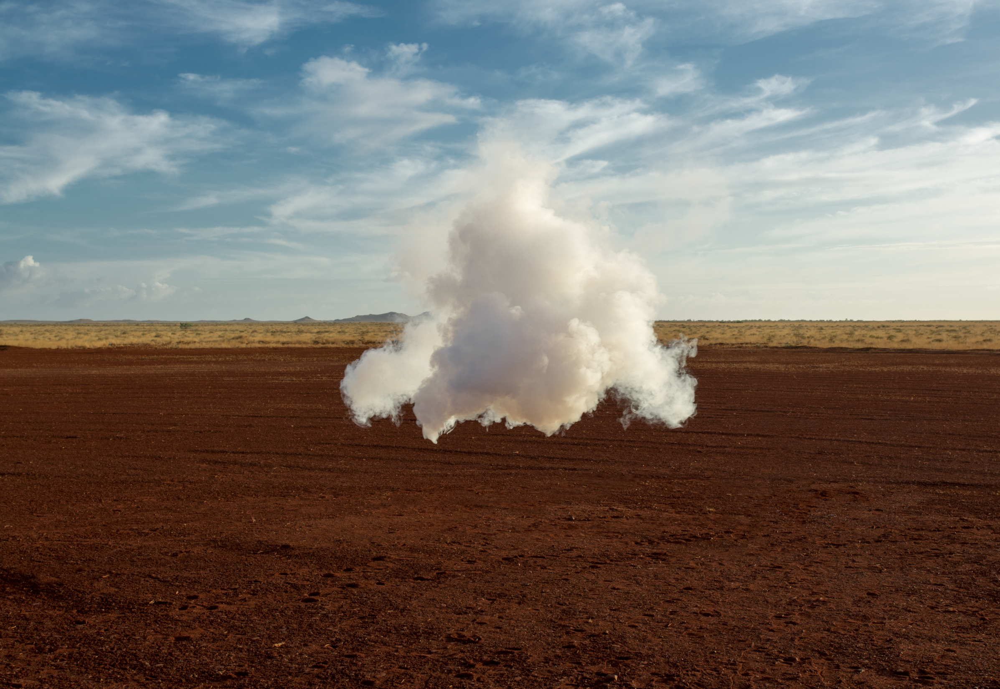
</div>

* En la actualidad existen muchos proveedores cloud: AWS, Google Cloud, Azure, DigitalOcean, etc


* **Deta**: especializado en el despliegue de microservicios, como FastAPI. Por tanto, es muy fácil de utilizar (cinco minutos), y es gratuito con unos límites muy razonables.

https://www.deta.sh/

**Ejercicio** Siguiendo las instrucciones de https://fastapi.tiangolo.com/deployment/deta/, despliega la anterior API en la nube pública de Deta 